In [ ]:
!pip install -q kagglehub
!pip install -q tqdm

import os
import tarfile
import glob
import random
from pathlib import Path
from collections import defaultdict

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from sklearn.metrics import (
    roc_auc_score,
    roc_curve,
    accuracy_score,
    precision_recall_fscore_support,
)

from tqdm.auto import tqdm
import kagglehub

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


Using device: cuda


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
path = kagglehub.dataset_download("ipythonx/mvtec-ad")
print("Raw dataset path from kagglehub:", path)

MVTEC_CLASSES = [
    "bottle", "cable", "capsule", "carpet", "grid",
    "hazelnut", "leather", "metal_nut", "pill", "screw",
    "tile", "toothbrush", "transistor", "wood", "zipper"
]

def maybe_extract_tar(root_path: str) -> str:
    """
    If the downloaded path contains a MVTec tar/tar.xz file, extract it
    and return the directory that contains the extracted data.
    """
    root_path = str(root_path)
    tar_candidates = []
    for f in os.listdir(root_path):
        if f.endswith(".tar") or f.endswith(".tar.xz") or f.endswith(".tar.gz"):
            tar_candidates.append(os.path.join(root_path, f))

    if not tar_candidates:
        return root_path

    tar_path = tar_candidates[0]
    extract_dir = os.path.join(root_path, "mvtec_extracted")
    if not os.path.exists(extract_dir):
        os.makedirs(extract_dir, exist_ok=True)
        print(f"Extracting {tar_path} ...")
        with tarfile.open(tar_path, "r:*") as tarf:
            tarf.extractall(extract_dir)
    else:
        print("Extraction dir already exists, skipping tar extraction.")
    return extract_dir

def find_mvtec_root(start_path: str) -> str:
    """
    Recursively search for the directory that directly contains all
    MVTec AD class folders.
    """
    start_path = str(start_path)
    for current_root, dirs, files in os.walk(start_path):
        dir_set = set(dirs)
        if set(MVTEC_CLASSES).issubset(dir_set):
            return current_root
    return None

base_path = maybe_extract_tar(path)

mvtec_root = find_mvtec_root(base_path)

if mvtec_root is None:
    candidate = os.path.join(base_path, "mvtec_anomaly_detection")
    if os.path.isdir(candidate):
        mvtec_root = candidate
    else:
        raise RuntimeError(
            "Could not automatically find MVTec class folders. "
            "Please inspect 'path' printed above and adjust 'mvtec_root' manually."
        )

print("Final MVTec root:", mvtec_root)
print("Available class folders:", os.listdir(mvtec_root))


Using Colab cache for faster access to the 'mvtec-ad' dataset.
Raw dataset path from kagglehub: /kaggle/input/mvtec-ad
Final MVTec root: /kaggle/input/mvtec-ad
Available class folders: ['wood', 'screw', 'metal_nut', 'capsule', 'readme.txt', 'hazelnut', 'carpet', 'pill', 'license.txt', 'grid', 'zipper', 'transistor', 'tile', 'leather', 'toothbrush', 'bottle', 'cable']


In [ ]:
from typing import Tuple, List

IMG_SIZE = 256

import torchvision.transforms as T

train_transform = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomRotation(degrees=10),
    T.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.02),
    T.ToTensor(),
])

test_transform = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.ToTensor(),
])

class MVTecImageDataset(Dataset):
    """
    MVTec AD dataset for image-level anomaly detection.

    split = 'train': only train/good images, label=0
    split = 'test' : test/good label=0, test/<defect> label=1
    """

    def __init__(
        self,
        root: str,
        cls_name: str,
        split: str,
        transform=None,
    ):
        super().__init__()
        assert split in ["train", "test"]
        self.root = root
        self.cls_name = cls_name
        self.split = split
        self.transform = transform

        self.img_paths: List[str] = []
        self.labels: List[int] = []

        class_dir = os.path.join(root, cls_name)

        if split == "train":
            img_dir = os.path.join(class_dir, "train", "good")
            if not os.path.isdir(img_dir):
                raise RuntimeError(f"Train directory not found: {img_dir}")
            files = sorted(glob.glob(os.path.join(img_dir, "*.png")) +
                           glob.glob(os.path.join(img_dir, "*.jpg")) +
                           glob.glob(os.path.join(img_dir, "*.jpeg")))
            self.img_paths.extend(files)
            self.labels.extend([0] * len(files))

        else:
            test_dir = os.path.join(class_dir, "test")
            if not os.path.isdir(test_dir):
                raise RuntimeError(f"Test directory not found: {test_dir}")
            for defect_type in sorted(os.listdir(test_dir)):
                defect_path = os.path.join(test_dir, defect_type)
                if not os.path.isdir(defect_path):
                    continue
                label = 0 if defect_type == "good" else 1
                files = sorted(glob.glob(os.path.join(defect_path, "*.png")) +
                               glob.glob(os.path.join(defect_path, "*.jpg")) +
                               glob.glob(os.path.join(defect_path, "*.jpeg")))
                self.img_paths.extend(files)
                self.labels.extend([label] * len(files))

        assert len(self.img_paths) == len(self.labels), "Mismatch between images and labels."

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx) -> Tuple[torch.Tensor, int, str]:
        img_path = self.img_paths[idx]
        label = self.labels[idx]

        img = Image.open(img_path).convert("RGB")
        if self.transform is not None:
            img = self.transform(img)

        return img, label, img_path


def build_dataloaders_for_class(
    cls_name: str,
    batch_size: int = 16,
    num_workers: int = 2,
):
    train_dataset = MVTecImageDataset(
        root=mvtec_root, cls_name=cls_name, split="train", transform=train_transform
    )
    test_dataset = MVTecImageDataset(
        root=mvtec_root, cls_name=cls_name, split="test", transform=test_transform
    )

    train_loader = DataLoader(
        train_dataset, batch_size=batch_size, shuffle=True,
        num_workers=num_workers, pin_memory=torch.cuda.is_available()
    )
    test_loader = DataLoader(
        test_dataset, batch_size=batch_size, shuffle=False,
        num_workers=num_workers, pin_memory=torch.cuda.is_available()
    )
    return train_loader, test_loader


In [ ]:
class ConvEncoder(nn.Module):
    def __init__(self, in_channels=3, base_channels=64):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, base_channels, 4, 2, 1),
            nn.ReLU(True),
            nn.Conv2d(base_channels, base_channels * 2, 4, 2, 1),
            nn.BatchNorm2d(base_channels * 2),
            nn.ReLU(True),
            nn.Conv2d(base_channels * 2, base_channels * 4, 4, 2, 1),
            nn.BatchNorm2d(base_channels * 4),
            nn.ReLU(True),
            nn.Conv2d(base_channels * 4, base_channels * 8, 4, 2, 1),
            nn.BatchNorm2d(base_channels * 8),
            nn.ReLU(True),
        )
        self.out_channels = base_channels * 8

    def forward(self, x):
        return self.conv(x)


class ConvDecoder(nn.Module):
    def __init__(self, out_channels=3, base_channels=64, in_channels=None):
        super().__init__()
        if in_channels is None:
            in_channels = base_channels * 8
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(in_channels, base_channels * 4, 4, 2, 1),
            nn.BatchNorm2d(base_channels * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(base_channels * 4, base_channels * 2, 4, 2, 1),
            nn.BatchNorm2d(base_channels * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(base_channels * 2, base_channels, 4, 2, 1),
            nn.BatchNorm2d(base_channels),
            nn.ReLU(True),
            nn.ConvTranspose2d(base_channels, out_channels, 4, 2, 1),
            nn.Sigmoid(),
        )

    def forward(self, z):
        return self.deconv(z)


class AE(nn.Module):
    def __init__(self, img_channels=3, base_channels=64):
        super().__init__()
        self.encoder = ConvEncoder(img_channels, base_channels)
        self.decoder = ConvDecoder(img_channels, base_channels, in_channels=self.encoder.out_channels)

    def forward(self, x):
        z = self.encoder(x)
        out = self.decoder(z)
        return out


class VAE(nn.Module):
    def __init__(self, img_channels=3, base_channels=64, latent_dim=256):
        super().__init__()
        self.encoder = ConvEncoder(img_channels, base_channels)
        feat_dim = self.encoder.out_channels * 16 * 16

        self.fc_mu = nn.Linear(feat_dim, latent_dim)
        self.fc_logvar = nn.Linear(feat_dim, latent_dim)
        self.fc_dec = nn.Linear(latent_dim, feat_dim)

        self.decoder = ConvDecoder(img_channels, base_channels, in_channels=self.encoder.out_channels)

    def encode(self, x):
        feat = self.encoder(x)
        feat_flat = feat.view(feat.size(0), -1)
        mu = self.fc_mu(feat_flat)
        logvar = self.fc_logvar(feat_flat)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        feat_flat = self.fc_dec(z)
        B = z.size(0)
        feat = feat_flat.view(B, self.encoder.out_channels, 16, 16)
        out = self.decoder(feat)
        return out

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        x_hat = self.decode(z)
        return x_hat, mu, logvar


class MemModule(nn.Module):

    def __init__(self, mem_slots=50, feat_dim=512):
        super().__init__()
        self.mem_slots = mem_slots
        self.feat_dim = feat_dim
        self.memory = nn.Parameter(torch.randn(mem_slots, feat_dim))

    def forward(self, x):
        B, C, H, W = x.shape
        feat = x.permute(0, 2, 3, 1).contiguous().view(-1, C)

        feat_norm = feat / (feat.norm(p=2, dim=1, keepdim=True) + 1e-8)
        mem_norm = self.memory / (self.memory.norm(p=2, dim=1, keepdim=True) + 1e-8)

        similarity = torch.matmul(feat_norm, mem_norm.t())
        attn = F.softmax(similarity, dim=1)

        recon_feat = torch.matmul(attn, self.memory)
        recon = recon_feat.view(B, H, W, C).permute(0, 3, 1, 2).contiguous()

        return recon, attn


class MemAE(nn.Module):
    def __init__(self, img_channels=3, base_channels=64, mem_slots=50):
        super().__init__()
        self.encoder = ConvEncoder(img_channels, base_channels)
        self.memory = MemModule(mem_slots, feat_dim=self.encoder.out_channels)
        self.decoder = ConvDecoder(img_channels, base_channels, in_channels=self.encoder.out_channels)

    def forward(self, x):
        feat = self.encoder(x)
        mem_feat, attn = self.memory(feat)
        out = self.decoder(mem_feat)
        return out, attn


In [ ]:
CHECKPOINT_DIR = "/content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

RESULTS_PATH = os.path.join(CHECKPOINT_DIR, "results_npz.npz")


SELECTED_CLASSES = MVTEC_CLASSES

BATCH_SIZE = 16
NUM_WORKERS = 0
BASE_CHANNELS = 64

EPOCHS = 50
LR = 1e-4
BETA_KL = 1e-4
MEM_ENTROPY_WEIGHT = 1e-4

THRESHOLD_QUANTILE = 0.8

FORCE_RETRAIN = False


def get_ckpt_path(method: str, cls_name: str) -> str:
    return os.path.join(CHECKPOINT_DIR, f"{method}_{cls_name}.pt")


def init_model(method: str):
    method = method.lower()
    if method == "ae":
        return AE(img_channels=3, base_channels=BASE_CHANNELS)
    elif method == "vae":
        return VAE(img_channels=3, base_channels=BASE_CHANNELS, latent_dim=256)
    elif method == "memae":
        return MemAE(img_channels=3, base_channels=BASE_CHANNELS, mem_slots=50)
    else:
        raise ValueError(f"Unknown method: {method}")


def train_one_model(
    model: nn.Module,
    train_loader: DataLoader,
    method: str,
    num_epochs: int = EPOCHS,
    lr: float = LR,
) -> nn.Module:
    model = model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
    mse_loss = nn.MSELoss(reduction="mean")

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        n_samples = 0

        pbar = tqdm(train_loader, desc=f"Train {method} | Epoch {epoch+1}/{num_epochs}", leave=False)
        for imgs, _, _ in pbar:
            imgs = imgs.to(device)
            optimizer.zero_grad()

            if method.lower() == "vae":
                recon, mu, logvar = model(imgs)
                rec_loss = mse_loss(recon, imgs)
                kl_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
                loss = rec_loss + BETA_KL * kl_loss
            elif method.lower() == "memae":
                recon, attn = model(imgs)
                rec_loss = mse_loss(recon, imgs)
                entropy = - (attn * torch.log(attn + 1e-8)).sum(dim=1).mean()
                loss = rec_loss + MEM_ENTROPY_WEIGHT * entropy
            else:
                recon = model(imgs)
                rec_loss = mse_loss(recon, imgs)
                loss = rec_loss

            loss.backward()
            optimizer.step()

            batch_size = imgs.size(0)
            running_loss += loss.item() * batch_size
            n_samples += batch_size
            pbar.set_postfix({"loss": running_loss / n_samples})

    return model


@torch.no_grad()
def compute_reconstruction_errors(
    model: nn.Module,
    data_loader: DataLoader,
    method: str,
):
    model.eval()
    all_scores = []
    all_labels = []
    all_paths = []

    for imgs, labels, paths in tqdm(data_loader, desc=f"Compute scores ({method})", leave=False):
        imgs = imgs.to(device)
        if method.lower() == "vae":
            recon, _, _ = model(imgs)
        elif method.lower() == "memae":
            recon, _ = model(imgs)
        else:
            recon = model(imgs)
        mse = torch.mean((recon - imgs) ** 2, dim=[1, 2, 3])
        all_scores.extend(mse.cpu().numpy().tolist())
        all_labels.extend(labels.numpy().tolist())
        all_paths.extend(paths)

    return np.array(all_scores), np.array(all_labels), all_paths


def compute_metrics(
    train_scores: np.ndarray,
    test_scores: np.ndarray,
    test_labels: np.ndarray,
    quantile: float = THRESHOLD_QUANTILE,
):

    threshold = np.quantile(test_scores, quantile)

    try:
        auroc = roc_auc_score(test_labels, test_scores)
    except ValueError:
        auroc = np.nan

    test_pred = (test_scores > threshold).astype(np.int64)

    acc = accuracy_score(test_labels, test_pred)
    precision, recall, f1, _ = precision_recall_fscore_support(
        test_labels, test_pred, average="binary", zero_division=0
    )

    return {
        "threshold": float(threshold),
        "auroc": float(auroc),
        "accuracy": float(acc),
        "precision": float(precision),
        "recall": float(recall),
        "f1": float(f1),
    }


In [ ]:
methods = ["AE", "VAE", "MemAE"]

results = defaultdict(dict)

for method in methods:
    print(f"\n=== Method: {method} ===")
    for cls_name in SELECTED_CLASSES:
        print(f"\nClass: {cls_name}")
        ckpt_path = get_ckpt_path(method, cls_name)

        train_loader, test_loader = build_dataloaders_for_class(
            cls_name, batch_size=BATCH_SIZE, num_workers=NUM_WORKERS
        )

        model = init_model(method)

        if os.path.exists(ckpt_path) and not FORCE_RETRAIN:
            print(f"Loading checkpoint: {ckpt_path}")
            model.load_state_dict(torch.load(ckpt_path, map_location=device))
            model = model.to(device)
        else:
            print("Training model from scratch...")
            model = train_one_model(model, train_loader, method, num_epochs=EPOCHS, lr=LR)
            torch.save(model.state_dict(), ckpt_path)
            print(f"Saved checkpoint to {ckpt_path}")

        train_scores, train_labels, _ = compute_reconstruction_errors(model, train_loader, method)

        test_scores, test_labels, test_paths = compute_reconstruction_errors(model, test_loader, method)

        metrics = compute_metrics(train_scores, test_scores, test_labels, quantile=THRESHOLD_QUANTILE)
        results[method][cls_name] = {
            "metrics": metrics,
            "train_scores": train_scores,
            "test_scores": test_scores,
            "test_labels": test_labels,
            "test_paths": test_paths,
        }

        print("Metrics:", metrics)

np.savez_compressed(
    RESULTS_PATH,
    results=np.array(results, dtype=object),
)
print("\nSaved results to:", RESULTS_PATH)



=== Method: AE ===

Class: bottle
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/AE_bottle.pt


Compute scores (AE):   0%|          | 0/14 [00:00<?, ?it/s]

Compute scores (AE):   0%|          | 0/6 [00:00<?, ?it/s]

Metrics: {'threshold': 0.001052871928550303, 'auroc': 0.657936507936508, 'accuracy': 0.42168674698795183, 'precision': 0.9411764705882353, 'recall': 0.25396825396825395, 'f1': 0.4}

Class: cable
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/AE_cable.pt


Compute scores (AE):   0%|          | 0/14 [00:00<?, ?it/s]

Compute scores (AE):   0%|          | 0/10 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0018514995463192463, 'auroc': 0.4677661169415293, 'accuracy': 0.48, 'precision': 0.7333333333333333, 'recall': 0.2391304347826087, 'f1': 0.36065573770491804}

Class: capsule
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/AE_capsule.pt


Compute scores (AE):   0%|          | 0/14 [00:00<?, ?it/s]

Compute scores (AE):   0%|          | 0/9 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0007252482464537024, 'auroc': 0.5927403270841644, 'accuracy': 0.3181818181818182, 'precision': 0.8518518518518519, 'recall': 0.21100917431192662, 'f1': 0.3382352941176471}

Class: carpet
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/AE_carpet.pt


Compute scores (AE):   0%|          | 0/18 [00:00<?, ?it/s]

Compute scores (AE):   0%|          | 0/8 [00:00<?, ?it/s]

Metrics: {'threshold': 0.001947128470055759, 'auroc': 0.33467094703049766, 'accuracy': 0.2564102564102564, 'precision': 0.5416666666666666, 'recall': 0.14606741573033707, 'f1': 0.23008849557522124}

Class: grid
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/AE_grid.pt


Compute scores (AE):   0%|          | 0/17 [00:00<?, ?it/s]

Compute scores (AE):   0%|          | 0/5 [00:00<?, ?it/s]

Metrics: {'threshold': 0.002386814868077636, 'auroc': 0.8654970760233919, 'accuracy': 0.47435897435897434, 'precision': 1.0, 'recall': 0.2807017543859649, 'f1': 0.4383561643835616}

Class: hazelnut
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/AE_hazelnut.pt


Compute scores (AE):   0%|          | 0/25 [00:00<?, ?it/s]

Compute scores (AE):   0%|          | 0/7 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0006192729342728855, 'auroc': 0.8457142857142856, 'accuracy': 0.5636363636363636, 'precision': 1.0, 'recall': 0.3142857142857143, 'f1': 0.4782608695652174}

Class: leather
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/AE_leather.pt


Compute scores (AE):   0%|          | 0/16 [00:00<?, ?it/s]

Compute scores (AE):   0%|          | 0/8 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0015022160718217493, 'auroc': 0.48301630434782605, 'accuracy': 0.4112903225806452, 'precision': 0.88, 'recall': 0.2391304347826087, 'f1': 0.37606837606837606}

Class: metal_nut
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/AE_metal_nut.pt


Compute scores (AE):   0%|          | 0/14 [00:00<?, ?it/s]

Compute scores (AE):   0%|          | 0/8 [00:00<?, ?it/s]

Metrics: {'threshold': 0.001066053891554475, 'auroc': 0.2448680351906158, 'accuracy': 0.1826086956521739, 'precision': 0.4782608695652174, 'recall': 0.11827956989247312, 'f1': 0.1896551724137931}

Class: pill
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/AE_pill.pt


Compute scores (AE):   0%|          | 0/17 [00:00<?, ?it/s]

Compute scores (AE):   0%|          | 0/11 [00:00<?, ?it/s]

Metrics: {'threshold': 0.000386545283254236, 'auroc': 0.8046917621385706, 'accuracy': 0.3592814371257485, 'precision': 1.0, 'recall': 0.24113475177304963, 'f1': 0.38857142857142857}

Class: screw
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/AE_screw.pt


Compute scores (AE):   0%|          | 0/20 [00:00<?, ?it/s]

Compute scores (AE):   0%|          | 0/10 [00:00<?, ?it/s]

Metrics: {'threshold': 0.00030031171045266094, 'auroc': 0.9930313588850175, 'accuracy': 0.45625, 'precision': 1.0, 'recall': 0.2689075630252101, 'f1': 0.423841059602649}

Class: tile
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/AE_tile.pt


Compute scores (AE):   0%|          | 0/15 [00:00<?, ?it/s]

Compute scores (AE):   0%|          | 0/8 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0013180041685700418, 'auroc': 0.7424242424242424, 'accuracy': 0.48717948717948717, 'precision': 1.0, 'recall': 0.2857142857142857, 'f1': 0.4444444444444444}

Class: toothbrush
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/AE_toothbrush.pt


Compute scores (AE):   0%|          | 0/4 [00:00<?, ?it/s]

Compute scores (AE):   0%|          | 0/3 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0036549818702042106, 'auroc': 0.5222222222222223, 'accuracy': 0.5, 'precision': 1.0, 'recall': 0.3, 'f1': 0.46153846153846156}

Class: transistor
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/AE_transistor.pt


Compute scores (AE):   0%|          | 0/14 [00:00<?, ?it/s]

Compute scores (AE):   0%|          | 0/7 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0008089374285191297, 'auroc': 0.43, 'accuracy': 0.56, 'precision': 0.4, 'recall': 0.2, 'f1': 0.26666666666666666}

Class: wood
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/AE_wood.pt


Compute scores (AE):   0%|          | 0/16 [00:00<?, ?it/s]

Compute scores (AE):   0%|          | 0/5 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0011963971192017198, 'auroc': 0.8991228070175439, 'accuracy': 0.4430379746835443, 'precision': 1.0, 'recall': 0.26666666666666666, 'f1': 0.42105263157894735}

Class: zipper
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/AE_zipper.pt


Compute scores (AE):   0%|          | 0/15 [00:00<?, ?it/s]

Compute scores (AE):   0%|          | 0/10 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0010831404943019152, 'auroc': 0.429359243697479, 'accuracy': 0.3576158940397351, 'precision': 0.8666666666666667, 'recall': 0.2184873949579832, 'f1': 0.348993288590604}

=== Method: VAE ===

Class: bottle
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/VAE_bottle.pt


Compute scores (VAE):   0%|          | 0/14 [00:00<?, ?it/s]

Compute scores (VAE):   0%|          | 0/6 [00:00<?, ?it/s]

Metrics: {'threshold': 0.00418707923963666, 'auroc': 0.9142857142857143, 'accuracy': 0.4457831325301205, 'precision': 1.0, 'recall': 0.2698412698412698, 'f1': 0.425}

Class: cable
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/VAE_cable.pt


Compute scores (VAE):   0%|          | 0/14 [00:00<?, ?it/s]

Compute scores (VAE):   0%|          | 0/10 [00:00<?, ?it/s]

Metrics: {'threshold': 0.009584758244454861, 'auroc': 0.7529985007496252, 'accuracy': 0.5466666666666666, 'precision': 0.9, 'recall': 0.29347826086956524, 'f1': 0.4426229508196721}

Class: capsule
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/VAE_capsule.pt


Compute scores (VAE):   0%|          | 0/14 [00:00<?, ?it/s]

Compute scores (VAE):   0%|          | 0/9 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0027796267531812195, 'auroc': 0.659752692461109, 'accuracy': 0.3333333333333333, 'precision': 0.8888888888888888, 'recall': 0.22018348623853212, 'f1': 0.35294117647058826}

Class: carpet
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/VAE_carpet.pt


Compute scores (VAE):   0%|          | 0/18 [00:00<?, ?it/s]

Compute scores (VAE):   0%|          | 0/8 [00:00<?, ?it/s]

Metrics: {'threshold': 0.013534102588891988, 'auroc': 0.35473515248796156, 'accuracy': 0.27350427350427353, 'precision': 0.5833333333333334, 'recall': 0.15730337078651685, 'f1': 0.24778761061946902}

Class: grid
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/VAE_grid.pt


Compute scores (VAE):   0%|          | 0/17 [00:00<?, ?it/s]

Compute scores (VAE):   0%|          | 0/5 [00:00<?, ?it/s]

Metrics: {'threshold': 0.00953320600092411, 'auroc': 0.948203842940685, 'accuracy': 0.47435897435897434, 'precision': 1.0, 'recall': 0.2807017543859649, 'f1': 0.4383561643835616}

Class: hazelnut
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/VAE_hazelnut.pt


Compute scores (VAE):   0%|          | 0/25 [00:00<?, ?it/s]

Compute scores (VAE):   0%|          | 0/7 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0016004818258807069, 'auroc': 0.8896428571428572, 'accuracy': 0.5636363636363636, 'precision': 1.0, 'recall': 0.3142857142857143, 'f1': 0.4782608695652174}

Class: leather
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/VAE_leather.pt


Compute scores (VAE):   0%|          | 0/16 [00:00<?, ?it/s]

Compute scores (VAE):   0%|          | 0/8 [00:00<?, ?it/s]

Metrics: {'threshold': 0.001683192583732307, 'auroc': 0.6226222826086956, 'accuracy': 0.4596774193548387, 'precision': 1.0, 'recall': 0.2717391304347826, 'f1': 0.42735042735042733}

Class: metal_nut
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/VAE_metal_nut.pt


Compute scores (VAE):   0%|          | 0/14 [00:00<?, ?it/s]

Compute scores (VAE):   0%|          | 0/8 [00:00<?, ?it/s]

Metrics: {'threshold': 0.004387513734400272, 'auroc': 0.5772238514173998, 'accuracy': 0.391304347826087, 'precision': 1.0, 'recall': 0.24731182795698925, 'f1': 0.39655172413793105}

Class: pill
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/VAE_pill.pt


Compute scores (VAE):   0%|          | 0/17 [00:00<?, ?it/s]

Compute scores (VAE):   0%|          | 0/11 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0015981001313775777, 'auroc': 0.6421167484997271, 'accuracy': 0.3473053892215569, 'precision': 0.9705882352941176, 'recall': 0.23404255319148937, 'f1': 0.37714285714285717}

Class: screw
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/VAE_screw.pt


Compute scores (VAE):   0%|          | 0/20 [00:00<?, ?it/s]

Compute scores (VAE):   0%|          | 0/10 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0033488576766103504, 'auroc': 0.9965156794425087, 'accuracy': 0.45625, 'precision': 1.0, 'recall': 0.2689075630252101, 'f1': 0.423841059602649}

Class: tile
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/VAE_tile.pt


Compute scores (VAE):   0%|          | 0/15 [00:00<?, ?it/s]

Compute scores (VAE):   0%|          | 0/8 [00:00<?, ?it/s]

Metrics: {'threshold': 0.013591939583420755, 'auroc': 0.5458152958152959, 'accuracy': 0.38461538461538464, 'precision': 0.75, 'recall': 0.21428571428571427, 'f1': 0.3333333333333333}

Class: toothbrush
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/VAE_toothbrush.pt


Compute scores (VAE):   0%|          | 0/4 [00:00<?, ?it/s]

Compute scores (VAE):   0%|          | 0/3 [00:00<?, ?it/s]

Metrics: {'threshold': 0.010472470149397851, 'auroc': 0.5583333333333333, 'accuracy': 0.5, 'precision': 1.0, 'recall': 0.3, 'f1': 0.46153846153846156}

Class: transistor
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/VAE_transistor.pt


Compute scores (VAE):   0%|          | 0/14 [00:00<?, ?it/s]

Compute scores (VAE):   0%|          | 0/7 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0035737399943172933, 'auroc': 0.7104166666666666, 'accuracy': 0.72, 'precision': 0.8, 'recall': 0.4, 'f1': 0.5333333333333333}

Class: wood
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/VAE_wood.pt


Compute scores (VAE):   0%|          | 0/16 [00:00<?, ?it/s]

Compute scores (VAE):   0%|          | 0/5 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0033184338361024863, 'auroc': 0.9078947368421052, 'accuracy': 0.4430379746835443, 'precision': 1.0, 'recall': 0.26666666666666666, 'f1': 0.42105263157894735}

Class: zipper
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/VAE_zipper.pt


Compute scores (VAE):   0%|          | 0/15 [00:00<?, ?it/s]

Compute scores (VAE):   0%|          | 0/10 [00:00<?, ?it/s]

Metrics: {'threshold': 0.003158415434882045, 'auroc': 0.6943277310924371, 'accuracy': 0.3708609271523179, 'precision': 0.9, 'recall': 0.226890756302521, 'f1': 0.3624161073825503}

=== Method: MemAE ===

Class: bottle
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/MemAE_bottle.pt


Compute scores (MemAE):   0%|          | 0/14 [00:00<?, ?it/s]

Compute scores (MemAE):   0%|          | 0/6 [00:00<?, ?it/s]

Metrics: {'threshold': 0.002608418371528387, 'auroc': 0.6015873015873017, 'accuracy': 0.42168674698795183, 'precision': 0.9411764705882353, 'recall': 0.25396825396825395, 'f1': 0.4}

Class: cable
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/MemAE_cable.pt


Compute scores (MemAE):   0%|          | 0/14 [00:00<?, ?it/s]

Compute scores (MemAE):   0%|          | 0/10 [00:00<?, ?it/s]

Metrics: {'threshold': 0.003619344159960747, 'auroc': 0.507496251874063, 'accuracy': 0.4666666666666667, 'precision': 0.7, 'recall': 0.22826086956521738, 'f1': 0.3442622950819672}

Class: capsule
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/MemAE_capsule.pt


Compute scores (MemAE):   0%|          | 0/14 [00:00<?, ?it/s]

Compute scores (MemAE):   0%|          | 0/9 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0007760081789456308, 'auroc': 0.5680095731950539, 'accuracy': 0.30303030303030304, 'precision': 0.8148148148148148, 'recall': 0.2018348623853211, 'f1': 0.3235294117647059}

Class: carpet
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/MemAE_carpet.pt


Compute scores (MemAE):   0%|          | 0/18 [00:00<?, ?it/s]

Compute scores (MemAE):   0%|          | 0/8 [00:00<?, ?it/s]

Metrics: {'threshold': 0.004402396641671658, 'auroc': 0.3322632423756019, 'accuracy': 0.2905982905982906, 'precision': 0.625, 'recall': 0.16853932584269662, 'f1': 0.26548672566371684}

Class: grid
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/MemAE_grid.pt


Compute scores (MemAE):   0%|          | 0/17 [00:00<?, ?it/s]

Compute scores (MemAE):   0%|          | 0/5 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0035697460640221833, 'auroc': 0.8320802005012531, 'accuracy': 0.47435897435897434, 'precision': 1.0, 'recall': 0.2807017543859649, 'f1': 0.4383561643835616}

Class: hazelnut
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/MemAE_hazelnut.pt


Compute scores (MemAE):   0%|          | 0/25 [00:00<?, ?it/s]

Compute scores (MemAE):   0%|          | 0/7 [00:00<?, ?it/s]

Metrics: {'threshold': 0.00068689975887537, 'auroc': 0.8775000000000001, 'accuracy': 0.5636363636363636, 'precision': 1.0, 'recall': 0.3142857142857143, 'f1': 0.4782608695652174}

Class: leather
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/MemAE_leather.pt


Compute scores (MemAE):   0%|          | 0/16 [00:00<?, ?it/s]

Compute scores (MemAE):   0%|          | 0/8 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0019351716851815583, 'auroc': 0.37533967391304346, 'accuracy': 0.33064516129032256, 'precision': 0.68, 'recall': 0.18478260869565216, 'f1': 0.2905982905982906}

Class: metal_nut
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/MemAE_metal_nut.pt


Compute scores (MemAE):   0%|          | 0/14 [00:00<?, ?it/s]

Compute scores (MemAE):   0%|          | 0/8 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0016073226928710938, 'auroc': 0.26588465298142716, 'accuracy': 0.16521739130434782, 'precision': 0.43478260869565216, 'recall': 0.10752688172043011, 'f1': 0.1724137931034483}

Class: pill
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/MemAE_pill.pt


Compute scores (MemAE):   0%|          | 0/17 [00:00<?, ?it/s]

Compute scores (MemAE):   0%|          | 0/11 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0004543861490674317, 'auroc': 0.756683033278778, 'accuracy': 0.3592814371257485, 'precision': 1.0, 'recall': 0.24113475177304963, 'f1': 0.38857142857142857}

Class: screw
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/MemAE_screw.pt


Compute scores (MemAE):   0%|          | 0/20 [00:00<?, ?it/s]

Compute scores (MemAE):   0%|          | 0/10 [00:00<?, ?it/s]

Metrics: {'threshold': 0.001968911988660693, 'auroc': 0.0006148800983808162, 'accuracy': 0.05625, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0}

Class: tile
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/MemAE_tile.pt


Compute scores (MemAE):   0%|          | 0/15 [00:00<?, ?it/s]

Compute scores (MemAE):   0%|          | 0/8 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0024704244919121266, 'auroc': 0.6522366522366523, 'accuracy': 0.4700854700854701, 'precision': 0.9583333333333334, 'recall': 0.27380952380952384, 'f1': 0.42592592592592593}

Class: toothbrush
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/MemAE_toothbrush.pt


Compute scores (MemAE):   0%|          | 0/4 [00:00<?, ?it/s]

Compute scores (MemAE):   0%|          | 0/3 [00:00<?, ?it/s]

Metrics: {'threshold': 0.013053316995501519, 'auroc': 0.49722222222222223, 'accuracy': 0.5, 'precision': 1.0, 'recall': 0.3, 'f1': 0.46153846153846156}

Class: transistor
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/MemAE_transistor.pt


Compute scores (MemAE):   0%|          | 0/14 [00:00<?, ?it/s]

Compute scores (MemAE):   0%|          | 0/7 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0015243847854435443, 'auroc': 0.4033333333333333, 'accuracy': 0.56, 'precision': 0.4, 'recall': 0.2, 'f1': 0.26666666666666666}

Class: wood
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/MemAE_wood.pt


Compute scores (MemAE):   0%|          | 0/16 [00:00<?, ?it/s]

Compute scores (MemAE):   0%|          | 0/5 [00:00<?, ?it/s]

Metrics: {'threshold': 0.0016191417817026379, 'auroc': 0.9640350877192982, 'accuracy': 0.4430379746835443, 'precision': 1.0, 'recall': 0.26666666666666666, 'f1': 0.42105263157894735}

Class: zipper
Loading checkpoint: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/MemAE_zipper.pt


Compute scores (MemAE):   0%|          | 0/15 [00:00<?, ?it/s]

Compute scores (MemAE):   0%|          | 0/10 [00:00<?, ?it/s]

Metrics: {'threshold': 0.002597145503386855, 'auroc': 0.40414915966386566, 'accuracy': 0.3443708609271523, 'precision': 0.8333333333333334, 'recall': 0.21008403361344538, 'f1': 0.33557046979865773}

Saved results to: /content/drive/MyDrive/mvtec_anomaly/checkpoints_mvtec/results_npz.npz


In [ ]:
from sklearn.metrics import precision_recall_fscore_support, accuracy_score

def find_best_threshold_by_f1(scores, labels, num_steps=200):

    scores = np.asarray(scores)
    labels = np.asarray(labels)

    thresholds = np.linspace(scores.min(), scores.max(), num_steps)

    best = {
        "threshold": float(thresholds[0]),
        "f1": -1.0,
        "accuracy": 0.0,
        "precision": 0.0,
        "recall": 0.0,
    }

    for thr in thresholds:
        preds = (scores > thr).astype(np.int64)
        precision, recall, f1, _ = precision_recall_fscore_support(
            labels, preds, average="binary", zero_division=0
        )
        acc = accuracy_score(labels, preds)

        if f1 > best["f1"]:
            best["threshold"] = float(thr)
            best["f1"] = float(f1)
            best["accuracy"] = float(acc)
            best["precision"] = float(precision)
            best["recall"] = float(recall)

    return best


In [ ]:
for method in methods:
    print(f"\n=== {method}: best-F1 thresholds per class ===")
    for cls_name in SELECTED_CLASSES:
        entry = results[method][cls_name]

        test_scores = entry["test_scores"]
        test_labels = entry["test_labels"]

        best = find_best_threshold_by_f1(test_scores, test_labels, num_steps=200)

        auroc = entry["metrics"]["auroc"]

        results[method][cls_name]["metrics_best_f1"] = {
            "threshold": best["threshold"],
            "auroc": float(auroc),
            "accuracy": best["accuracy"],
            "precision": best["precision"],
            "recall": best["recall"],
            "f1": best["f1"],
        }

        print(
            f"{cls_name:>12} | thr={best['threshold']:.3e} | "
            f"F1={best['f1']:.3f} | Acc={best['accuracy']:.3f} | "
            f"Prec={best['precision']:.3f} | Rec={best['recall']:.3f}"
        )



=== AE: best-F1 thresholds per class ===
      bottle | thr=7.387e-04 | F1=0.861 | Acc=0.759 | Prec=0.765 | Rec=0.984
       cable | thr=7.798e-04 | F1=0.755 | Acc=0.607 | Prec=0.611 | Rec=0.989
     capsule | thr=5.535e-04 | F1=0.900 | Acc=0.818 | Prec=0.824 | Rec=0.991
      carpet | thr=1.442e-03 | F1=0.859 | Acc=0.752 | Prec=0.759 | Rec=0.989
        grid | thr=1.670e-03 | F1=0.876 | Acc=0.808 | Prec=0.828 | Rec=0.930
    hazelnut | thr=2.646e-04 | F1=0.828 | Acc=0.755 | Prec=0.747 | Rec=0.929
     leather | thr=6.475e-04 | F1=0.847 | Acc=0.734 | Prec=0.740 | Rec=0.989
   metal_nut | thr=5.096e-04 | F1=0.889 | Acc=0.800 | Prec=0.807 | Rec=0.989
        pill | thr=2.849e-04 | F1=0.919 | Acc=0.850 | Prec=0.849 | Rec=1.000
       screw | thr=2.414e-04 | F1=0.979 | Acc=0.969 | Prec=0.967 | Rec=0.992
        tile | thr=9.274e-04 | F1=0.848 | Acc=0.744 | Prec=0.737 | Rec=1.000
  toothbrush | thr=2.776e-03 | F1=0.845 | Acc=0.738 | Prec=0.732 | Rec=1.000
  transistor | thr=5.004e-04 | F1=

In [ ]:
from sklearn.metrics import precision_recall_fscore_support

def find_best_threshold_by_f1(scores, labels):
    thresholds = np.linspace(scores.min(), scores.max(), 200)
    best_f1 = -1
    best_thr = thresholds[0]

    for thr in thresholds:
        preds = (scores > thr).astype(np.int64)
        precision, recall, f1, _ = precision_recall_fscore_support(
            labels, preds, average="binary", zero_division=0
        )
        if f1 > best_f1:
            best_f1 = f1
            best_thr = thr

    return best_thr, best_f1


In [ ]:
import torchvision.transforms as T

IMG_SIZE = 256

train_transform = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomRotation(degrees=10),
    T.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.02),
    T.ToTensor(),
])

test_transform = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.ToTensor(),
])


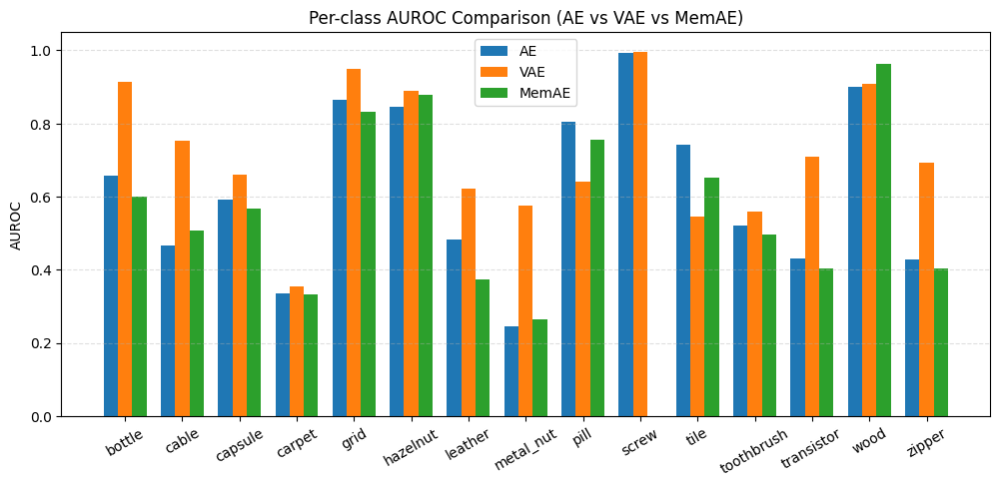

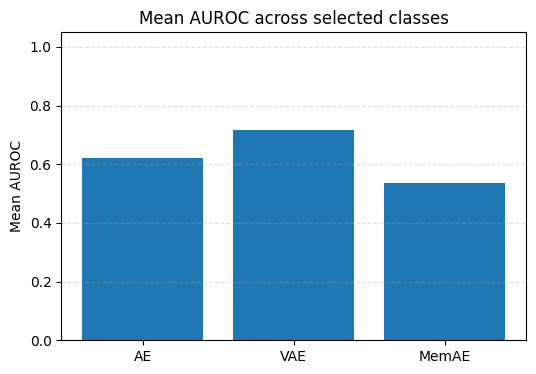

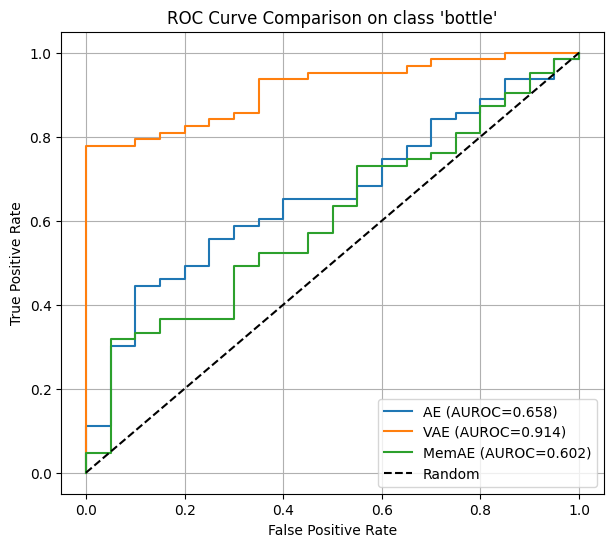

In [ ]:
auroc_table = {}
for method in methods:
    auroc_table[method] = []
    for cls_name in SELECTED_CLASSES:
        auroc = results[method][cls_name]["metrics"]["auroc"]
        auroc_table[method].append(auroc)

x = np.arange(len(SELECTED_CLASSES))
width = 0.25

plt.figure(figsize=(12, 5))
for i, method in enumerate(methods):
    plt.bar(x + i * width, auroc_table[method], width, label=method)

plt.xticks(x + width, SELECTED_CLASSES, rotation=30)
plt.ylabel("AUROC")
plt.title("Per-class AUROC Comparison (AE vs VAE vs MemAE)")
plt.ylim(0.0, 1.05)
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.show()

mean_aurocs = {method: np.mean(auroc_table[method]) for method in methods}
plt.figure(figsize=(6, 4))
plt.bar(list(mean_aurocs.keys()), list(mean_aurocs.values()))
plt.ylabel("Mean AUROC")
plt.title("Mean AUROC across selected classes")
plt.ylim(0.0, 1.05)
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.show()

selected_class_for_roc = SELECTED_CLASSES[0]
plt.figure(figsize=(7, 6))
for method in methods:
    test_scores = results[method][selected_class_for_roc]["test_scores"]
    test_labels = results[method][selected_class_for_roc]["test_labels"]
    try:
        fpr, tpr, _ = roc_curve(test_labels, test_scores)
        auroc = roc_auc_score(test_labels, test_scores)
        plt.plot(fpr, tpr, label=f"{method} (AUROC={auroc:.3f})")
    except ValueError:
        continue

plt.plot([0, 1], [0, 1], "k--", label="Random")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title(f"ROC Curve Comparison on class '{selected_class_for_roc}'")
plt.legend()
plt.grid(True)
plt.show()



=== Demo for class: screw ===


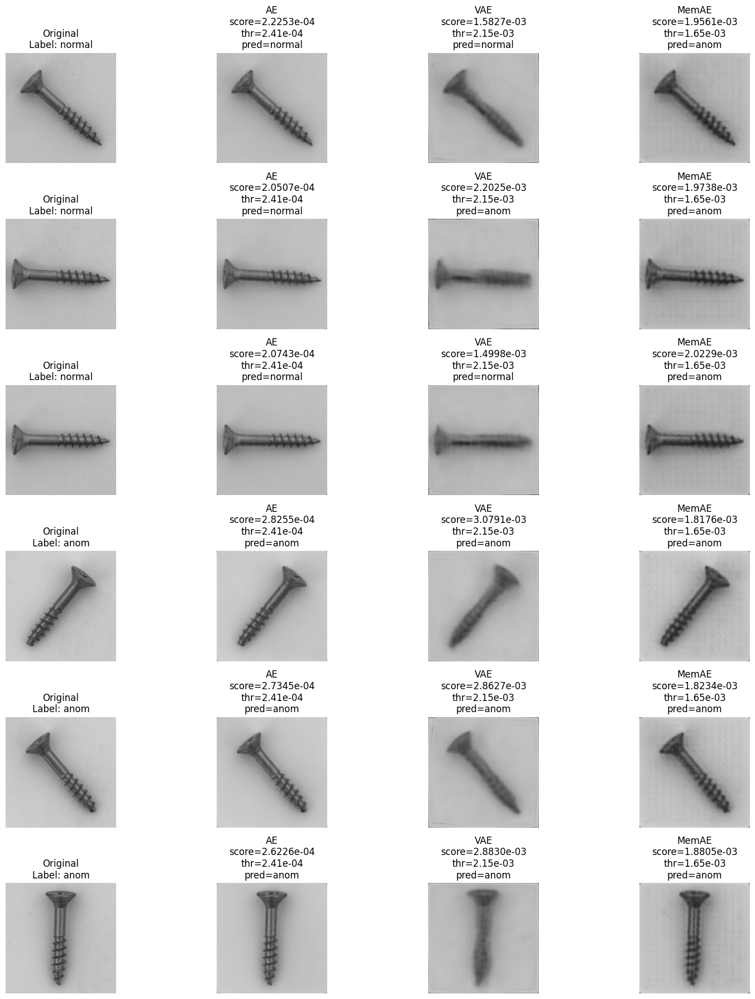

In [ ]:
def show_demo_for_class(cls_name: str, num_examples: int = 3):
    print(f"\n=== Demo for class: {cls_name} ===")

    _, test_loader = build_dataloaders_for_class(
        cls_name, batch_size=1, num_workers=NUM_WORKERS
    )

    normal_examples, anomaly_examples = [], []

    for imgs, labels, paths in test_loader:
        label = int(labels.item())
        entry = (imgs, label, paths[0])
        if label == 0 and len(normal_examples) < num_examples:
            normal_examples.append(entry)
        elif label == 1 and len(anomaly_examples) < num_examples:
            anomaly_examples.append(entry)

        if len(normal_examples) >= num_examples and len(anomaly_examples) >= num_examples:
            break

    examples = normal_examples + anomaly_examples

    models_dict = {}
    thresholds_dict = {}

    for method in methods:
        model = init_model(method)
        ckpt_path = get_ckpt_path(method, cls_name)
        model.load_state_dict(torch.load(ckpt_path, map_location=device))
        model = model.to(device)
        model.eval()

        thresholds_dict[method] = results[method][cls_name]["metrics_best_f1"]["threshold"]

        models_dict[method] = model

    n_rows = len(examples)
    n_cols = 1 + len(methods)
    plt.figure(figsize=(4 * n_cols, 3 * n_rows))

    for row_idx, (imgs, label, path) in enumerate(examples):
        imgs = imgs.to(device)
        original = imgs[0].cpu().permute(1, 2, 0).numpy()

        ax = plt.subplot(n_rows, n_cols, row_idx * n_cols + 1)
        ax.imshow(original)
        ax.axis("off")
        ax.set_title(f"Original\nLabel: {'anom' if label==1 else 'normal'}")

        for col_idx, method in enumerate(methods, start=2):
            model = models_dict[method]
            with torch.no_grad():
                if method.lower() == "vae":
                    recon, _, _ = model(imgs)
                elif method.lower() == "memae":
                    recon, _ = model(imgs)
                else:
                    recon = model(imgs)

                mse = torch.mean((recon - imgs) ** 2, dim=[1,2,3]).item()

            recon_np = recon[0].cpu().permute(1, 2, 0).numpy()
            threshold = thresholds_dict[method]
            pred_label = int(mse > threshold)

            ax = plt.subplot(n_rows, n_cols, row_idx * n_cols + col_idx)
            ax.imshow(np.clip(recon_np, 0, 1))
            ax.axis("off")
            ax.set_title(
                f"{method}\nscore={mse:.4e}\nthr={threshold:.2e}\n"
        f"pred={'anom' if pred_label else 'normal'}"
            )

    plt.tight_layout()
    plt.show()


demo_class = SELECTED_CLASSES[9]
show_demo_for_class(demo_class, num_examples=3)



=== Demo for class: pill ===


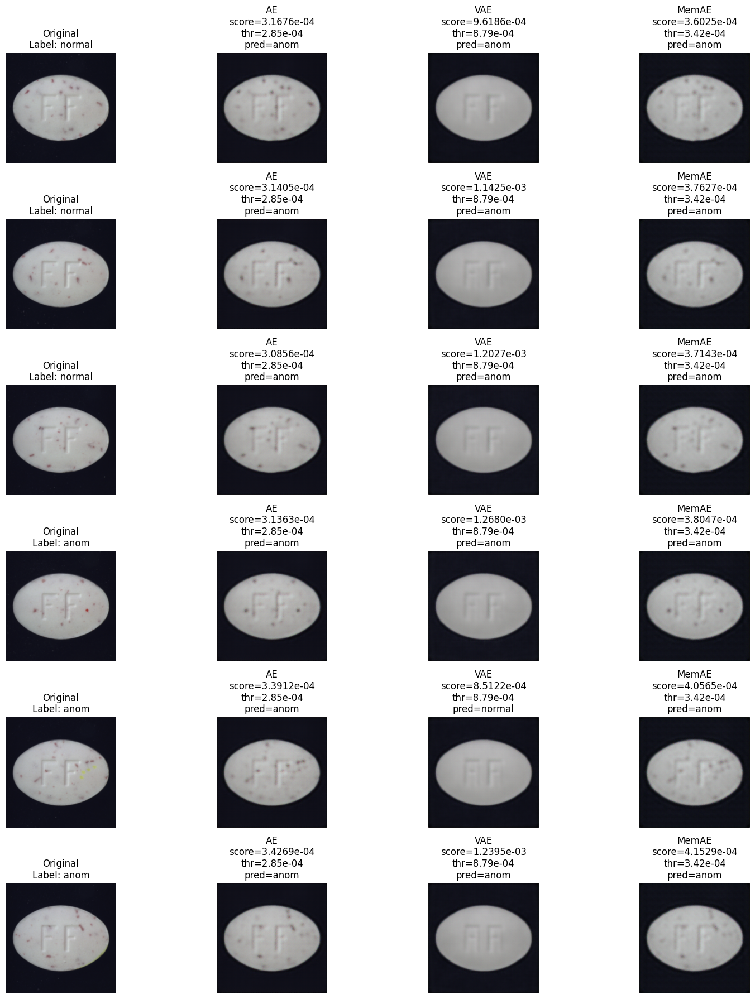


=== Demo for class: grid ===


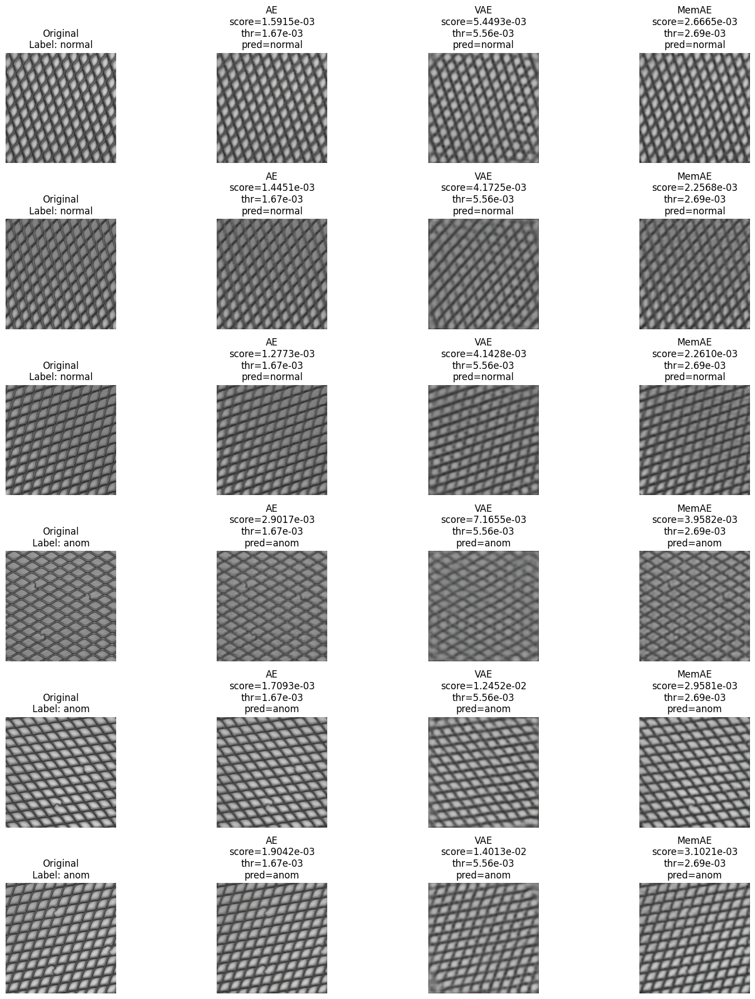


=== Demo for class: hazelnut ===


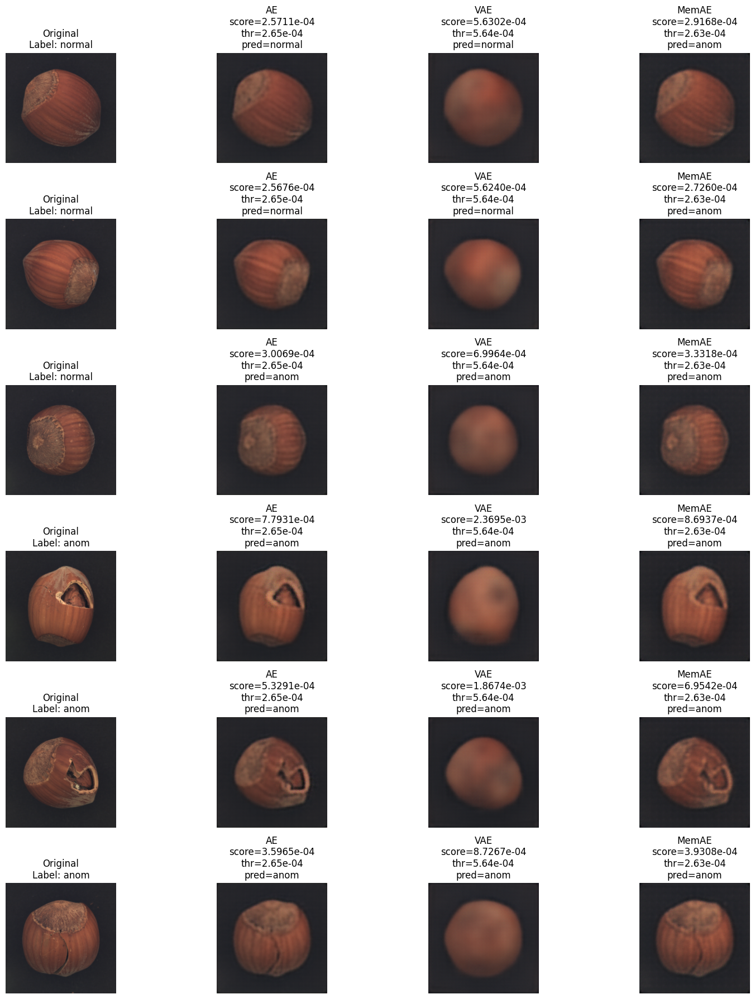

In [ ]:
DEMO_CLASSES = ["pill", "grid", "hazelnut"]

for cls in DEMO_CLASSES:
    show_demo_for_class(cls, num_examples=3)


In [ ]:
def show_demo_all_correct(cls_name: str, num_examples: int = 3):
    print(f"\n=== Demo (all models correct) for class: {cls_name} ===")

+    _, test_loader = build_dataloaders_for_class(
        cls_name, batch_size=1, num_workers=NUM_WORKERS
    )

    models_dict = {}
    thresholds_dict = {}
    for method in methods:
        model = init_model(method)
        ckpt_path = get_ckpt_path(method, cls_name)
        model.load_state_dict(torch.load(ckpt_path, map_location=device))
        model = model.to(device)
        model.eval()
        models_dict[method] = model

        thresholds_dict[method] = results[method][cls_name]["metrics_best_f1"]["threshold"]

    correct_normals = []
    correct_anoms = []
    with torch.no_grad():
        for imgs, labels, paths in test_loader:
            imgs = imgs.to(device)
            label = int(labels.item())
            path = paths[0]

            all_preds = {}
            all_good = True

            for method in methods:
                model = models_dict[method]
                if method.lower() == "vae":
                    recon, _, _ = model(imgs)
                elif method.lower() == "memae":
                    recon, _ = model(imgs)
                else:
                    recon = model(imgs)

                mse = torch.mean((recon - imgs) ** 2, dim=[1, 2, 3]).item()
                thr = thresholds_dict[method]
                pred = int(mse > thr)
                all_preds[method] = (mse, thr, pred)

                if pred != label:
                    all_good = False
                    break

            if all_good:
                entry = (imgs[0].cpu(), label, path, all_preds)
                if label == 0 and len(correct_normals) < num_examples:
                    correct_normals.append(entry)
                elif label == 1 and len(correct_anoms) < num_examples:
                    correct_anoms.append(entry)

            if len(correct_normals) >= num_examples and len(correct_anoms) >= num_examples:
                break

    examples = correct_normals + correct_anoms
    if len(examples) == 0:
        print("No samples where all three models are correct. Try a different class or reduce num_examples.")
        return

    n_rows = len(examples)
    n_cols = 1 + len(methods)
    plt.figure(figsize=(4 * n_cols, 3 * n_rows))

    for row_idx, (img_tensor, label, path, all_preds) in enumerate(examples):
        original = img_tensor.permute(1, 2, 0).numpy()

        ax = plt.subplot(n_rows, n_cols, row_idx * n_cols + 1)
        ax.imshow(original)
        ax.axis("off")
        ax.set_title(f"Original\nLabel: {'anom' if label==1 else 'normal'}")

        img_batch = img_tensor.unsqueeze(0).to(device)
        for col_idx, method in enumerate(methods, start=2):
            model = models_dict[method]
            if method.lower() == "vae":
                recon, _, _ = model(img_batch)
            elif method.lower() == "memae":
                recon, _ = model(img_batch)
            else:
                recon = model(img_batch)

            recon_np = recon[0].detach().cpu().permute(1, 2, 0).numpy()
            mse, thr, pred = all_preds[method]

            ax = plt.subplot(n_rows, n_cols, row_idx * n_cols + col_idx)
            ax.imshow(np.clip(recon_np, 0, 1))
            ax.axis("off")
            ax.set_title(
                f"{method}\nscore={mse:.3e}\nthr={thr:.3e}\n"
                f"pred={'anom' if pred==1 else 'normal'}"
            )


    plt.tight_layout()
    plt.show()



=== Demo (all models correct) for class: bottle ===


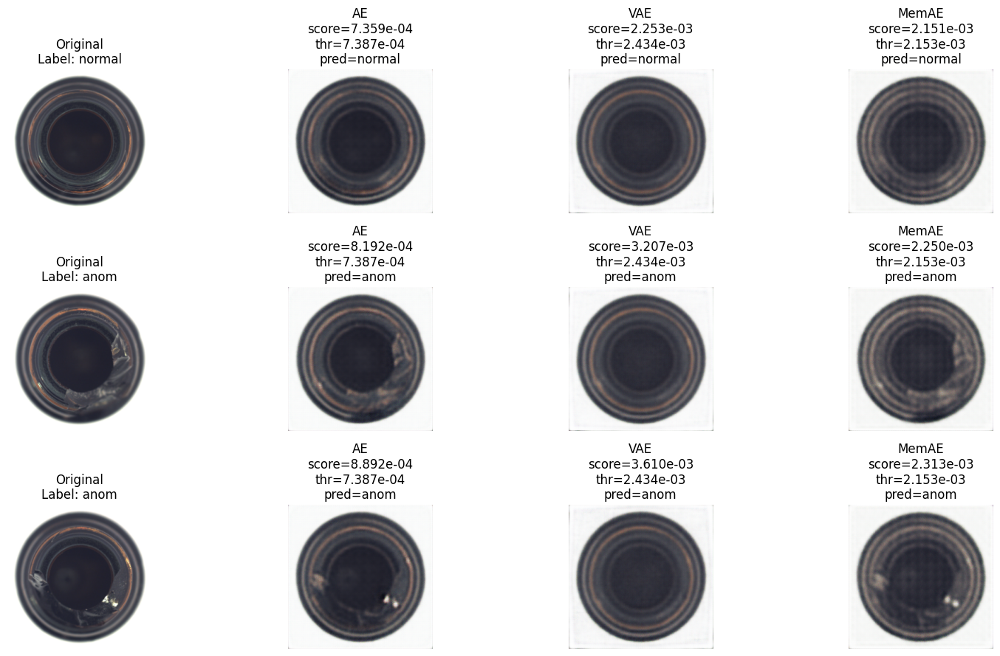


=== Demo (all models correct) for class: wood ===


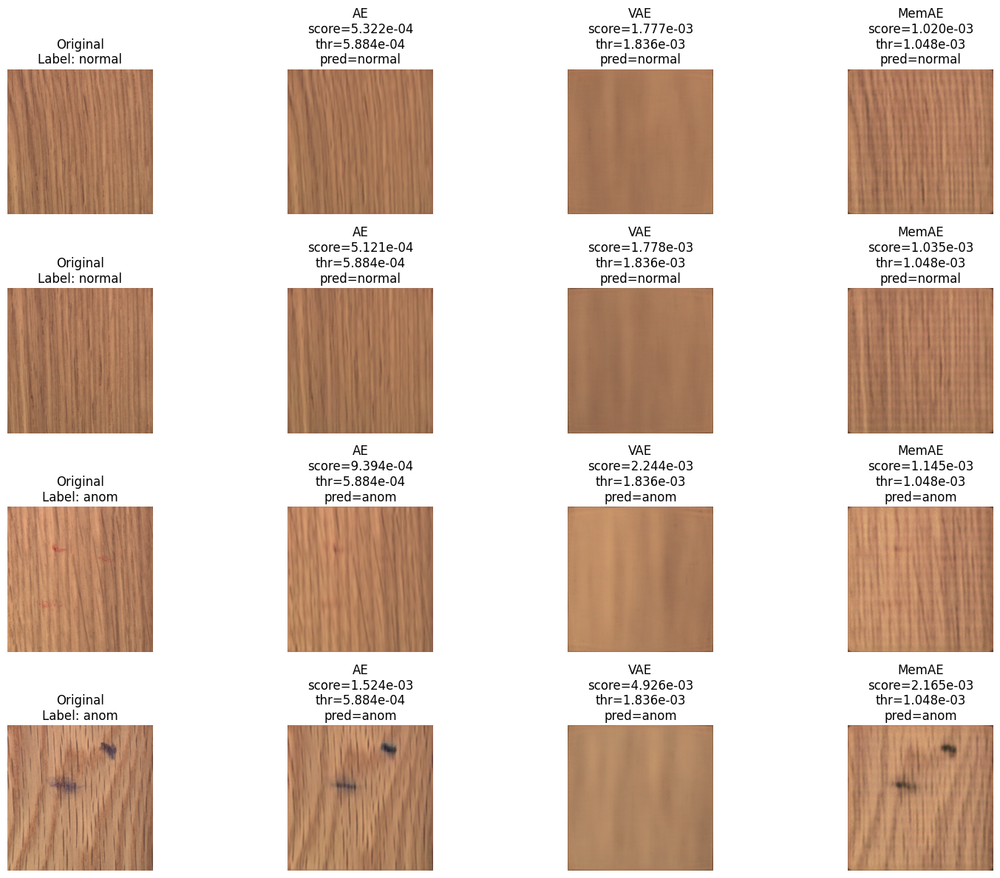


=== Demo (all models correct) for class: capsule ===


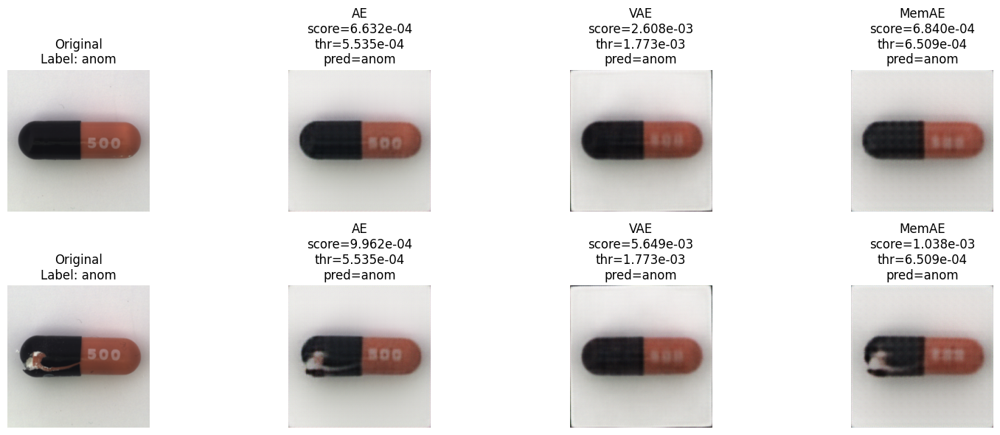


=== Demo (all models correct) for class: zipper ===


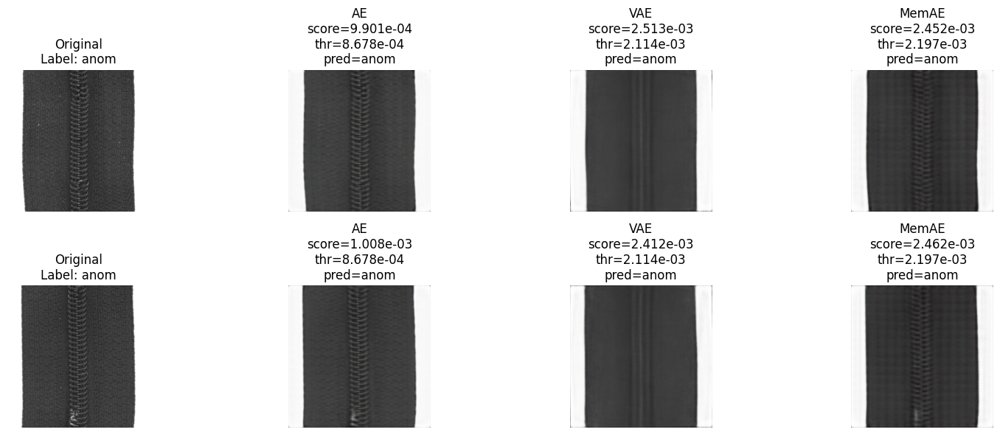

In [ ]:
for cls in ["bottle", "wood", "capsule", "zipper"]:
    show_demo_all_correct(cls_name=cls, num_examples=2)
